## scVelo

元URL: https://scvelo.readthedocs.io/VelocityBasics.html

最終更新日: 2021/4/28

Scanpyと同じグループが作ったRNA速度解析ツールであるscVeloのチュートリアルです。

### 前準備

Google Colabで本チュートリアルを実行する場合は、まず下記コマンドでscVeloをインストールしてください。

In [24]:
!pip install -U scvelo python-igraph

Requirement already up-to-date: scvelo in /usr/local/lib/python3.7/dist-packages (0.2.3)
     |████████████████████████████████| 3.2MB 7.8MB/s 





####（loomファイルの作成）

自分自身のデータに対してscVeloを適用するには、まず[Velocyto](https://singlecellanalysistutorial.readthedocs.io/en/latest/notebooks/Velocyto.html)を使って.loomファイルを作成する必要があります。

（このチュートリアルでは既に用意されている [pancreas data](https://scvelo.readthedocs.io/scvelo.datasets.pancreas.html)を使いますので下記コマンドは不要です。）

In [ ]:
import scvelo as scv

# loomファイルをadataオブジェクトに読み込み
adata = scv.read('path/file.loom', cache=True)
   
# 複数のデータをマージする場合
scv.utils.merge(adata, adata_loom)

### データのロード

In [1]:
import scvelo as scv
scv.logging.print_version()

scv.settings.verbosity = 3          # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')     # for beautified visualization

Running scvelo 0.2.3 (python 3.7.8) on 2021-04-28 22:05.


In [3]:
# pancreasデータ読み込み
adata = scv.datasets.pancreas()
adata

AnnData object with n_obs × n_vars = 3696 × 27998
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score'
    var: 'highly_variable_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

細胞名、遺伝子名は `adata.obs_names` and `adata.var_names` で表示できます。
AnnData objects (adata) は`adata_subset = adata[:, list_of_gene_names]`でスライス可能です。

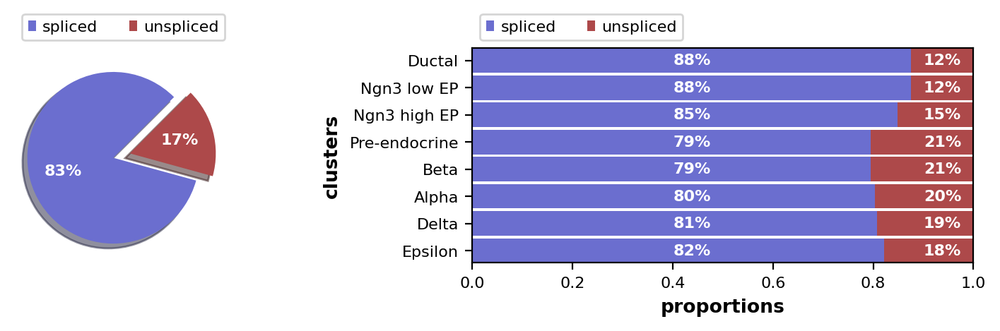

In [4]:
# Scanpyのクラスタリング結果を用いる場合は groupby="leiden" を追加
scv.pl.proportions(adata)

- ここでは spliced/unspliced mRNA数の割合が表示されます。使用したプロトコル（Drop-Seq、Smart-Seq）にもよりますが、通常、intron配列を含むスプライスされていない分子が10％～25％程度存在します。
- また、スプライシング効率の一貫性を確認するために、クラスターレベルでのばらつきを調べることをお勧めします。ここでは予想通りのばらつきが見られ、周期性管細胞 (cycling ductal cells)ではスプライスされていない分子の割合がわずかに低く、その後、多くの遺伝子が転写され始めるNgn3-high細胞やPre-endocrine細胞では、細胞運命コミットメントでの割合が高くなっていることがわかりました。

### データの前処理

- HVGの抽出と、発現量の正規化、対数化が含まれます。

フィルタリングと正規化は、 spliced/unspliced カウントにも同じように適用されます。

これらはすべて単一の関数 ``scv.pp.filter_and_normalize`` にまとめられており、以下のコマンドが含まれます。

In [5]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)

# ↑のコマンドは以下の４つを実行したのと同じ
#scv.pp.filter_genes(adata, min_shared_counts=20)
#scv.pp.normalize_per_cell(adata)
#scv.pp.filter_genes_dispersion(adata, n_top_genes=2000)
#scv.pp.log1p(adata)

Filtered out 20801 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


- さらに、PCA空間上のnearest neighborsで計算された1次と2次のモーメント (means and uncentered variances)  が必要です。
- これには`scv.pp.moments`関数を用います。この関数は内部で`scv.pp.pca`と`scv.pp.neighbors`を実行しています。
- 決定論的速度推定 (deterministic velocity estimation) には1次モーメントが必要であり，確率的推定 (stochastic estimation) には2次モーメントも必要となります。

In [6]:
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

computing neighbors
    finished (0:00:04) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


### さらなる前処理 (optional)
- さらなる前処理（バッチ効果補正など）を使用して、不要な変動源を除去することも可能です。
- 追加の前処理ステップは`adata.X`にのみ影響し、スプライス/アンスプライス数には適用されないことに注意してください。

### RNA速度 (velocity) の推定

- Velocityは遺伝子発現空間におけるベクトルであり、個々の細胞の移動の「方向」と「速度」を表します。
    - Velocity = speed + direction
- Velocitiesは、確率的（stochastic, デフォルト）または決定論的 (by setting `mode='deterministic'`)に、スプライシング動態の転写ダイナミクスをモデル化することで得られます。
- 各遺伝子について、pre-mature (unspliced), mature (spliced)の mRNAカウントの定常状態比 (steady-state-ratio) をフィットさせ、これが一定の転写状態を表します。Velocityはこのsteady-state-ratioの残差として求めます。
- 正のVelocityは、ある遺伝子が発現上昇していることを示しており、定常状態で予想されるよりも多くunspliced mRNAが存在する細胞で発生します。逆に、負の速度は遺伝子がダウンレギュレーションされていることを示しています。

- 完全な動的モデルの解は、`mode='dynamical'`を設定することで得られます。このモードは事前に `scv.tl.recover_dynamics(adata)` を実行しておく必要があります。このモデルについては次のチュートリアルで詳しく説明します。

In [7]:
scv.tl.velocity(adata)

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


計算されたvelocityは、count行列と同様に `adata.layer` に保存されます。

- 遺伝子間のvelocityの組み合わせは、個々の細胞の将来の状態を推定するために使用することができます。
- velocityを低次元のembeddingに投影するために、細胞間遷移確率が推定されます。つまり、各velocityベクトルについて、その方向に沿った細胞遷移の可能性が高いものを見つけます。
- 遷移確率は、潜在的な細胞間遷移とvelocityベクトルとの間のコサイン相関を用いて計算され、行列内のvelocity graphに格納されます。
- 結果として得られるvelocity graphは$n_{obs} \times n_{obs}$ の次元を持ち、速度ベクトルによって説明できる細胞の状態変化を要約しています（高速化のために、`approx=True`を設定することで、縮小されたPCA空間上で計算することもできます）。

In [8]:
scv.tl.velocity_graph(adata)

computing velocity graph
    finished (0:00:11) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


- 様々なアプリケーションのために、velocityグラフを遷移行列に変換することができます。これはガウスカーネルを適用してコサイン類似度を実際の遷移確率に変換することで行います。
- マルコフ遷移行列には `scv.utils.get_transition_matrix` でアクセスできます。

- 前述したように、velocityを低次元空間に埋め込むために、`scv.tl.velocity_embedding`を使用して得られた遷移確率に対する平均遷移を計算します。
- さらに、マルコフ連鎖に沿って細胞をその起源と潜在的な運命までトレースすることができ、それにより、軌跡の根と終点を得ることができます。これは `scv.tl.terminal_states` で参照できます。

## RNA速度の投影

- velocityは任意の低次元軸に投影され、以下のいずれかの方法で可視化されます。
    - on cellular level with `scv.pl.velocity_embedding`,
    - as gridlines with `scv.pl.velocity_embedding_grid`,
    - or as streamlines with `scv.pl.velocity_embedding_stream`.

- デモデータには既に計算済みの UMAPデータと注釈付きクラスタが含まれています。
- 独自のデータに適用する場合、これらは `scv.tl.umap` と `scv.tl.louvain` で取得できます。詳細については、[scanpyのチュートリアル](https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html)を参照してください。
- さらに、すべてのプロット関数はデフォルトで`basis='umap'`と`color='cluster'`を使用するように設定されています。

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


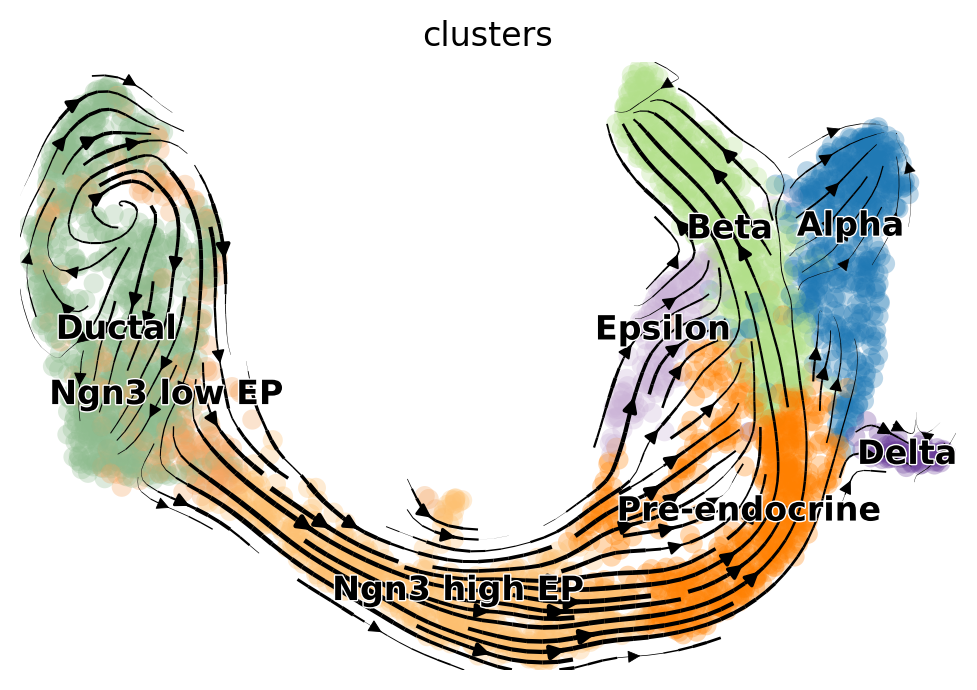

In [9]:
scv.pl.velocity_embedding_stream(adata, basis='umap')

- ストリームラインとして表示されるvelocity ベクトルフィールドは、発生過程の詳細な洞察をもたらします。
     - 管腔細胞 (ductal cells) と内分泌前駆細胞 (endocrine progenitors) の周期的集団を正確に描き出します。
     - さらに、細胞の系統コミットメント、細胞周期の出口、および内分泌細胞の分化の細胞の状態を表す。


### 細胞レベル velocity 

- 速度ベクトル場は1細胞レベルでも得られます。各矢印は個々の細胞の移動方向と速度を示しています。
- これにより、例えば、Ngn3細胞の初期の内分泌関与（黄色）や、近末端のα細胞（青）と一過性のβ細胞（緑）の間の明確な違いが明らかになりました。

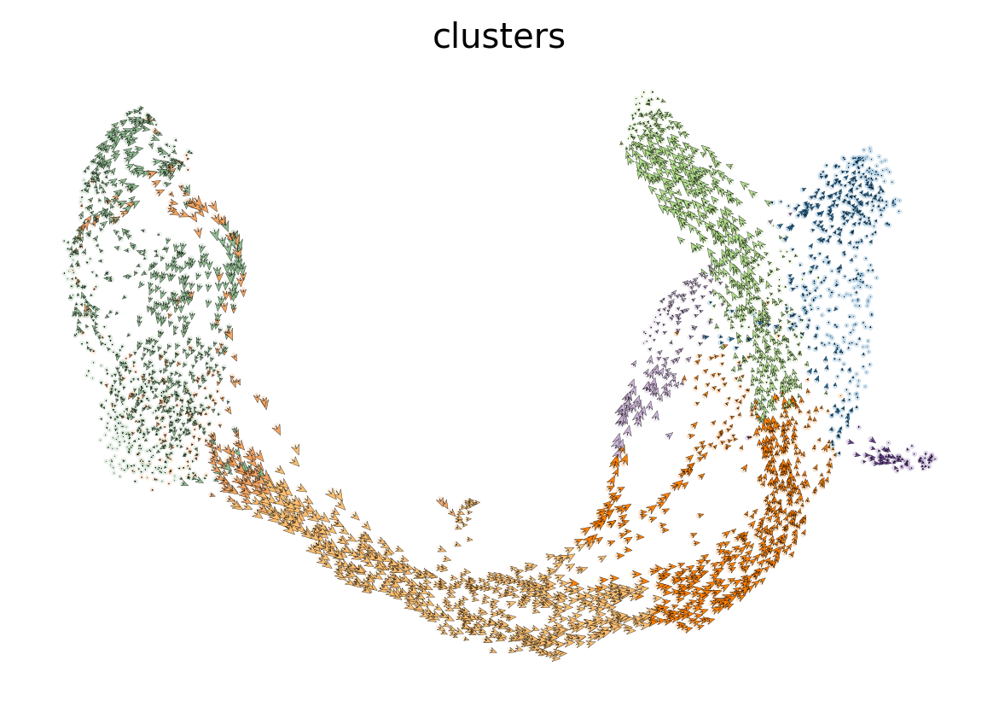

In [10]:
scv.pl.velocity_embedding(adata, arrow_length=3, arrow_size=2, dpi=120)

## RNA速度の解釈

これはおそらく最も重要な部分です。つまり、生物学的な結論を投影されたvelocityに限定するのではなく、推定された方向が特定の遺伝子にどのように支持されているかを理解するために、相図 (phase portraits)を介して個々の遺伝子のダイナミクスを調べるべきです。

 spliced vs. unspliced phase portrait をどのように解釈するかについては、[こちらのgif](https://user-images.githubusercontent.com/31883718/80227452-eb822480-864d-11ea-9399-56886c5e2785.gif) を参照してください。
   - 遺伝子の活性は転写制御によって調整されている。
   - 特定の遺伝子に対して転写が誘導されると、（新たに転写された）precursor unspliced mRNAsが増加し、逆に転写が抑制されたり、転写が行われなかったりすると、unspliced mRNAsが減少します。
   - スプライスされたmRNAは、未転写mRNAから産生され、時間差を持って同じ傾向をたどる。
   - 時間は、 hidden/latent 変数である。そのため実際に測定されているもの、すなわち相図に表示されているspliced and unspliced mRNAsからダイナミクスを推測する必要があります。

さて、いくつかのマーカー遺伝子の相図を `scv.pl.velocity(adata, gene_names)` または `scv.pl.scatter(adata, gene_names)` で可視化してみましょう。

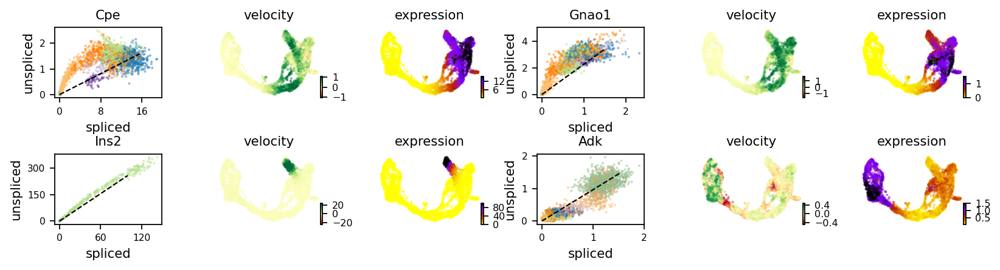

In [11]:
scv.pl.velocity(adata, ['Cpe',  'Gnao1', 'Ins2', 'Adk'], ncols=2)

- 黒線は推定された ‘steady-state’ の比率、すなわち、一定の転写状態における unspliced to spliced mRNA abundanceの比率に対応しています。
- 特定の遺伝子のRNA velocity は、残差、すなわち観測がその定常状態線 (黒線)からどれだけ逸脱しているかとして決定されます。
- 正の速度は、ある遺伝子が発現上昇していることを示しており、定常状態で予想されるよりもunspliced mRNAが豊富な細胞で発生します。
- 逆に、負の速度は遺伝子が発現抑制されていることを示しています。

- 例えば、Cpeは発現上昇したNgn3（黄色）からPre-endocrine（オレンジ）からβ細胞（緑）への方向性を説明し、Adkは発現抑制されたDuctal（濃い緑）からNgn3（黄色）から残りの内分泌細胞への方向性を説明しています。

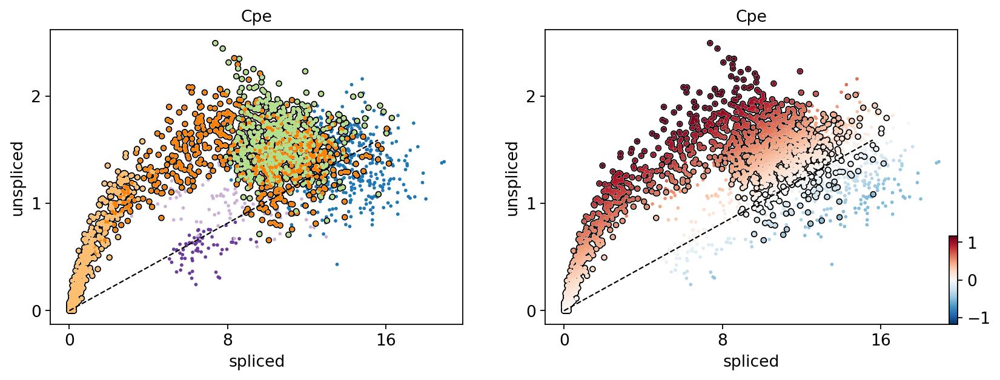

In [12]:
scv.pl.scatter(adata, 'Cpe',
               color=['clusters', 'velocity'],
               add_outline='Ngn3 high EP, Pre-endocrine, Beta')

## Identify important genes

- 私たちは、結果として得られるベクトルフィールドと推定される系統を説明するのに役立つ遺伝子を特定する体系的な方法を必要としています。
- そのために、scVeloはどの遺伝子がクラスター特異的な微分速度発現を持ち、残りの集団と比較して有意に高いか低いかを検定するモジュールを提供します。

- `scv.tl.rank_velocity_genes` モジュールは differential velocity t-test を実行し、各クラスタの遺伝子ランキングを出力します。
- 遺伝子候補選択のテストを制限するための閾値を設定することができます (例: `min_corr`)。

In [13]:
scv.tl.rank_velocity_genes(adata, groupby='clusters', min_corr=.3)

df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:02) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
0,Notch2,Ptpn3,Pde1c,Pam,Pax6,Zcchc16,Zdbf2,Tmcc3
1,Sox5,Hacd1,Ptprs,Sdk1,Unc5c,Nlgn1,Spock3,Heg1
2,Krt19,Hspa8,Pclo,Baiap3,Nnat,Nell1,Akr1c19,Gpr179
3,Hspa8,Gm8113,Rap1gap2,Abcc8,Tmem108,Prune2,Ptprt,Ica1
4,Ano6,Kcnq1,Ttyh2,Gnas,Ptprt,Ksr2,Snap25,Ncoa7


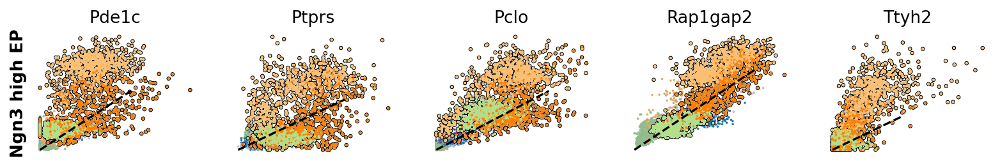

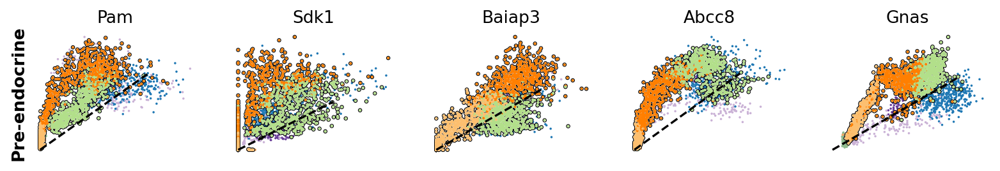

In [14]:
kwargs = dict(frameon=False, size=10, linewidth=1.5,
              add_outline='Ngn3 high EP, Pre-endocrine, Beta')

scv.pl.scatter(adata, df['Ngn3 high EP'][:5], ylabel='Ngn3 high EP', **kwargs)
scv.pl.scatter(adata, df['Pre-endocrine'][:5], ylabel='Pre-endocrine', **kwargs)

例えば、Ptprs、Pclo、Pam、Abcc8、Gnasなどの遺伝子は、Ngn3 high EP（黄色）→Pre-endocrine（オレンジ）→Beta（緑）という方向性を示しています。

## 循環する前駆細胞のRNA速度
RNA速度によって検出される細胞周期は、細胞周期スコア（位相マーカー遺伝子の平均発現量を標準化したスコア）によって生物学的に肯定されます。


calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


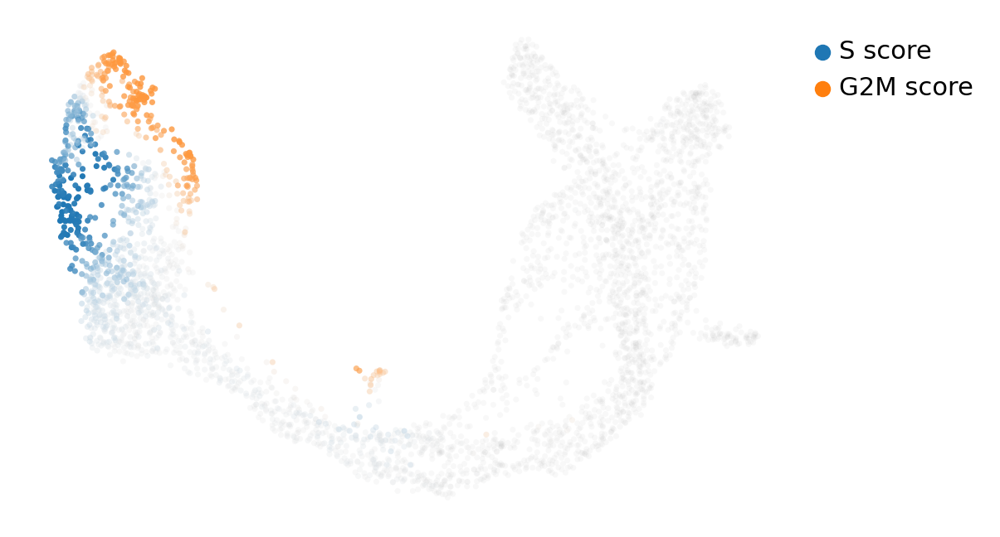

In [15]:
scv.tl.score_genes_cell_cycle(adata)
scv.pl.scatter(adata, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])

周期性のある管状細胞 (Ductal cells)については、SとG2Mの位相マーカーを介してスクリーニングすることができます。上のモジュールはまた、位相マーカー遺伝子のランク付けやソートに使用できるスピアマン相関スコアを計算しており、それらのphase portraitsを表示するために使用することができます。

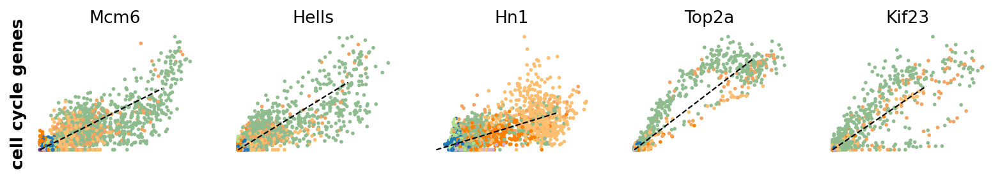

In [16]:
s_genes, g2m_genes = scv.utils.get_phase_marker_genes(adata)
s_genes = scv.get_df(adata[:, s_genes], 'spearmans_score', sort_values=True).index
g2m_genes = scv.get_df(adata[:, g2m_genes], 'spearmans_score', sort_values=True).index

kwargs = dict(frameon=False, ylabel='cell cycle genes')
scv.pl.scatter(adata, list(s_genes[:2]) + list(g2m_genes[:3]), **kwargs)

特にHellsとTop2aは、循環する前駆体のベクトル場を説明するのに適しています。
Top2aは、G2M段階で実際にピークを迎える直前に高い速度が割り当てられる。そこでは、負の速度は、その後のダウンレギュレーションの直後に完全に一致する。

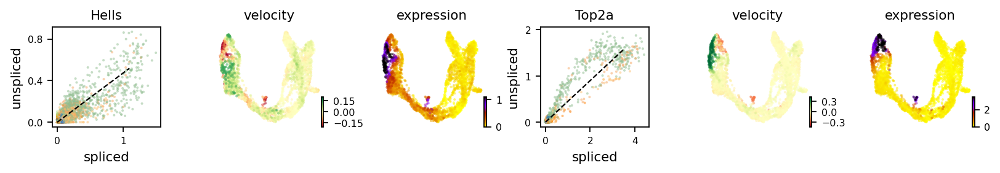

In [17]:
scv.pl.velocity(adata, ['Hells', 'Top2a'], ncols=2) # , add_outline=True

## Speed and coherence

さらに2つの有用な統計量があります。
   - 微分の速度や速度は速度ベクトルの長さで与えられます。
   - ベクトル場のコヒーレンス（すなわち、速度ベクトルが隣接する速度とどのように相関するか）は、信頼性の尺度となります。

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


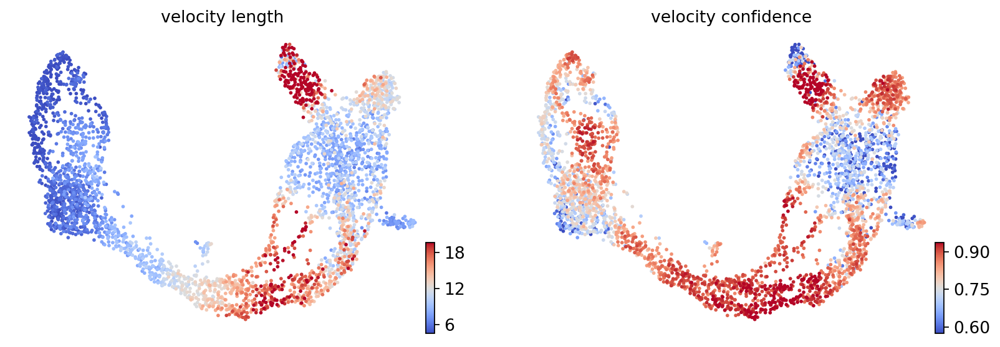

In [18]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

これらの結果から、細胞の分化のペースが遅い場合と早い場合、またその方向が不明な場合があることが明らかになりました。

クラスタレベルでは、細胞周期の終了後（Ngn3低EP）には分化が実質的に加速され、ベータ細胞の産生中にはペースを維持し、アルファ細胞の産生中にはペースが低下することがわかります。

In [19]:
df = adata.obs.groupby('clusters')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

clusters,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
velocity_length,5.707904,6.227023,13.257741,13.429206,14.219882,10.491913,7.623143,10.477606
velocity_confidence,0.775042,0.756474,0.896944,0.830438,0.725973,0.752715,0.691188,0.784467


## Velocity graph and pseudotime

- Velocityグラフを可視化して、推定された全ての細胞間接続/遷移を描写することができます。
- 閾値を設定することで、高確率の遷移に限定することができます。
- 例えば、このグラフは、初期と後期の前内分泌細胞からのイプシロン細胞生産の2つのフェーズを示しています。

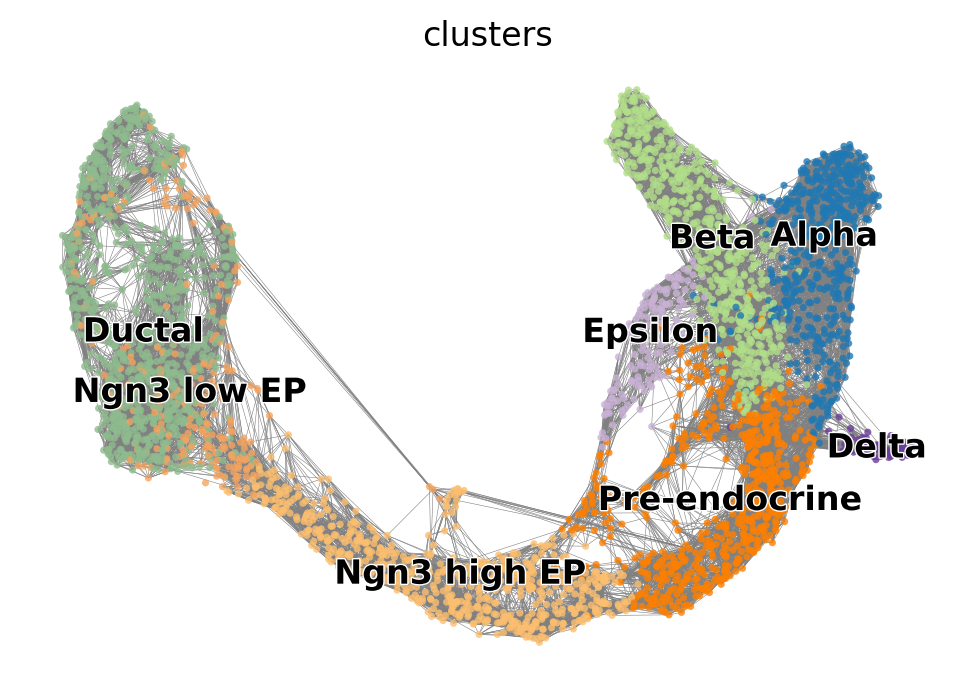

In [20]:
scv.pl.velocity_graph(adata, threshold=.1)

さらに、このグラフは、指定された細胞の子孫/先祖を描くために使用することができます。ここでは、前内分泌細胞は、その潜在的な運命までトレースされています。

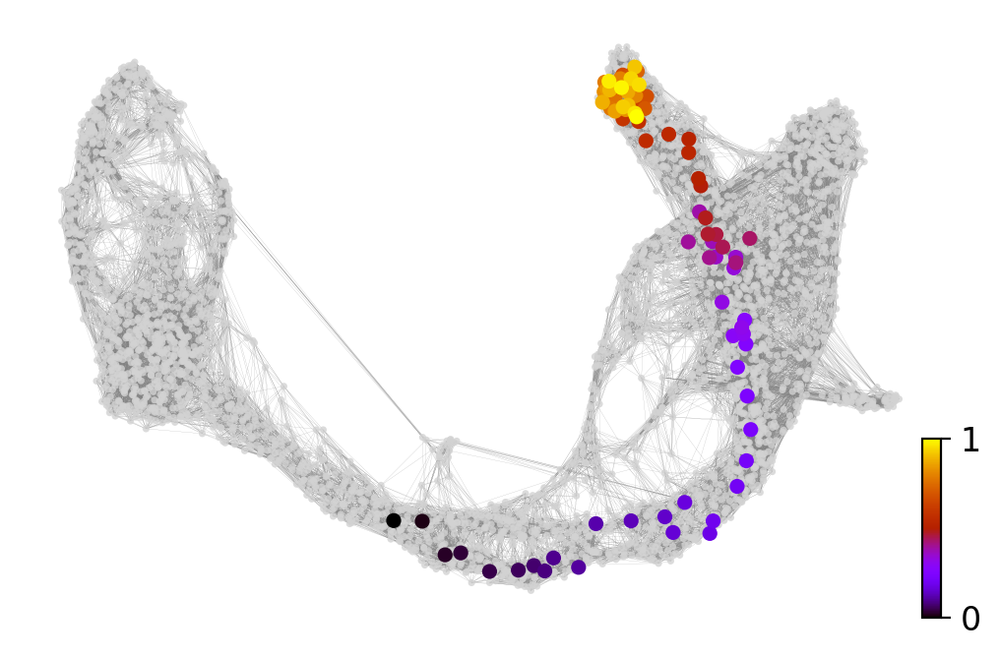

In [21]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=70)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

- 最後に、速度グラフに基づいて、 velocity pseudotimeを計算することができる。
- グラフからroot細胞からの分布を推定した後、root細胞からグラフに沿って歩いた後、その細胞に到達するまでにかかる平均ステップ数を測定することで計算されます。

- diffusion pseudotimeとは逆に、root細胞を暗黙的に推定し、similarity-based diffusion kernelの代わりに有向速度グラフに基づいています。

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


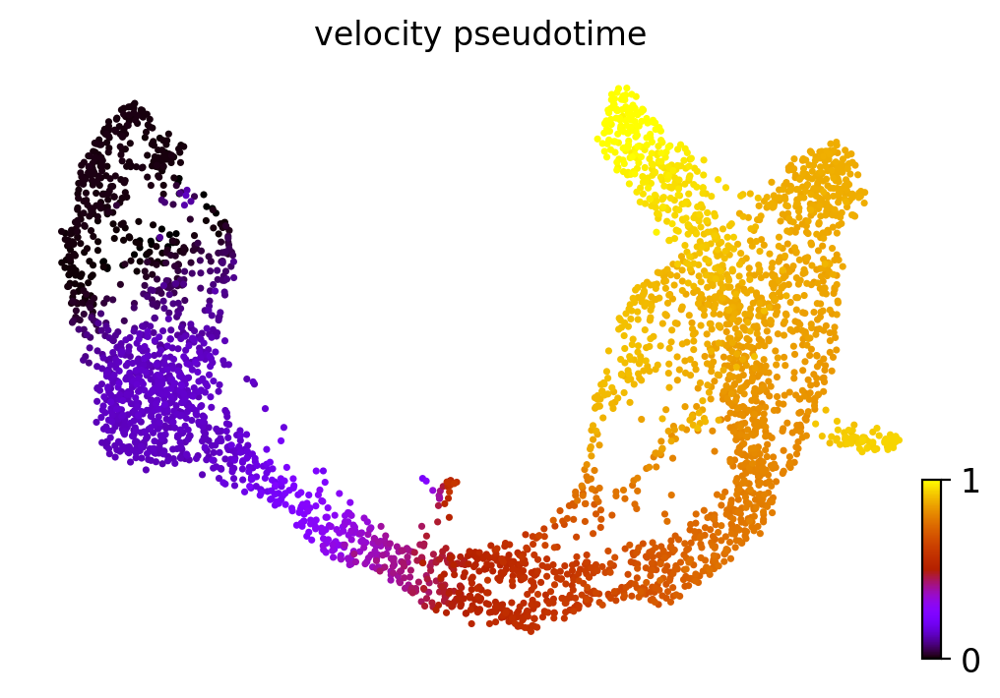

In [22]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

## PAGA velocity graph

- PAGAによるグラフの粗視化は、軌跡推論のための最高性能の手法としてベンチマーキングされています。
- PAGAは、2つのクラスタ間の接続性に対応した重み付きエッジを用いて、データのトポロジーをグラフ化したようなマップを提供する。
- ここでは、PAGAをRNA速度の方向性に基づいて拡張しています。

In [25]:
scv.tl.paga(adata, groups='clusters')
df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
Ductal,0,0.15,0,0,0,0,0,0
Ngn3 low EP,0,0,0.24,0,0,0,0,0
Ngn3 high EP,0,0,0,0.23,0,0,0,0
Pre-endocrine,0,0,0,0,0.5,0.12,0.21,0.12
Beta,0,0,0,0,0,0,0,0
Alpha,0,0,0,0,0,0,0,0
Delta,0,0,0,0,0,0,0,0
Epsilon,0,0,0,0,0,0,0,0


これは、左/行から右/列へと読み取ることができ、例えば、DuctalからNgn3 low EPへの信頼性ある遷移を割り当てることができます。

この表は、UMAP上に埋め込まれた有向グラフでまとめることができます。

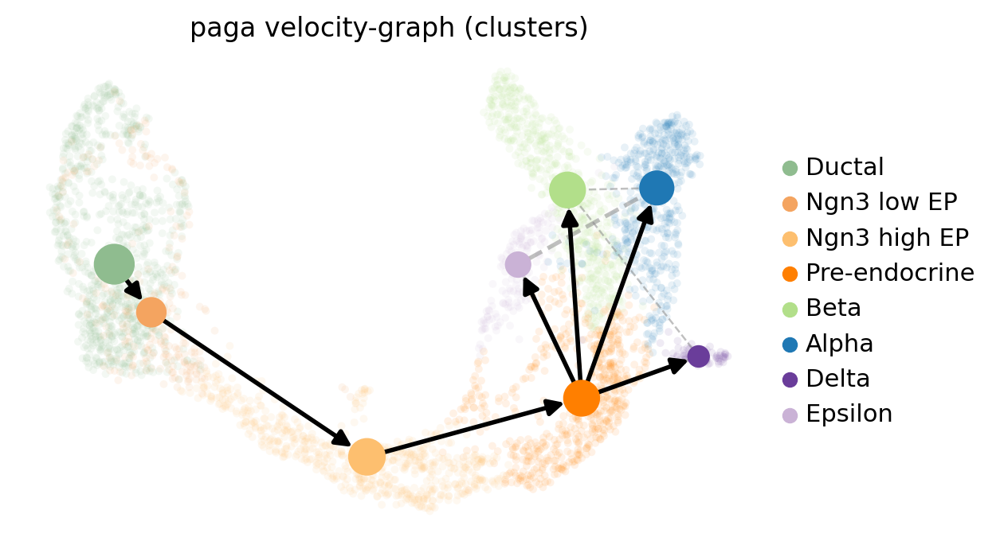

In [26]:
scv.pl.paga(adata, basis='umap',
            size=50,
            alpha=.1,
            min_edge_width=2,
            node_size_scale=1.5)

## Dynamical Modeling
https://scvelo.readthedocs.io/DynamicalModeling.html

- ここでは全体的な転写ダイナミクスを求めるために一般化された動的モデルを用います。
- これにより、潜伏時間や潜在的なドライバー遺伝子の同定など、いくつかの付加的な知見が得られます。
- 前回のチュートリアルと同様に、pancreasの内分泌系の発生をデータに用います。

In [27]:
import scvelo as scv
scv.logging.print_version()

scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo')  # for beautified visualization

Running scvelo 0.2.3 (python 3.7.10) on 2021-04-28 12:35.


In [28]:
adata = scv.datasets.pancreas()
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

Filtered out 20801 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


### Dynamical Model

ここではスプライシング動態の転写ダイナミクスを完全に学習するためにDynamical Modelを実行します。
このモデルは、尤度ベースの期待値最大化フレームワークを用いて、反応速度と細胞固有の潜伏変数、すなわち転写状態と細胞内潜伏時間のパラメータを反復的に推定することで求められます。これにより、各遺伝子のunspliced/spliced phaseの軌跡を学習します。

In [29]:
scv.tl.recover_dynamics(adata)
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)

recovering dynamics (using 1/2 cores)



    finished (0:10:41) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:03) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:08) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


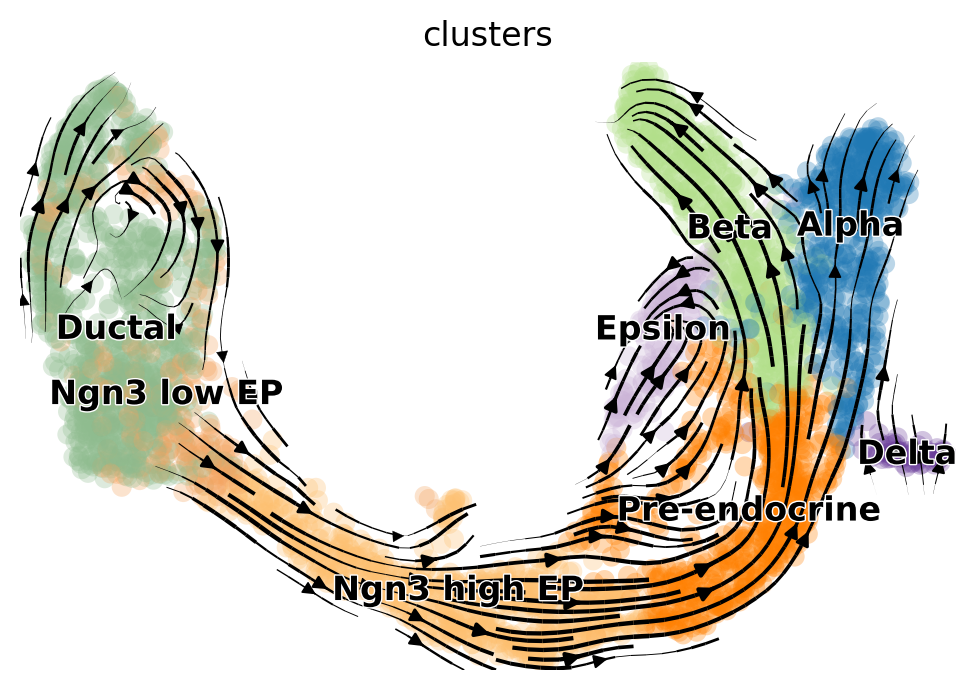

In [30]:
scv.pl.velocity_embedding_stream(adata, basis='umap')

### Kinetic rate paramters

RNAの転写、スプライシング、分解の速度は、実験データを必要とせずに推定できます。
これらは、細胞の同一性や表現型の不均一性をよりよく理解するために有用です。

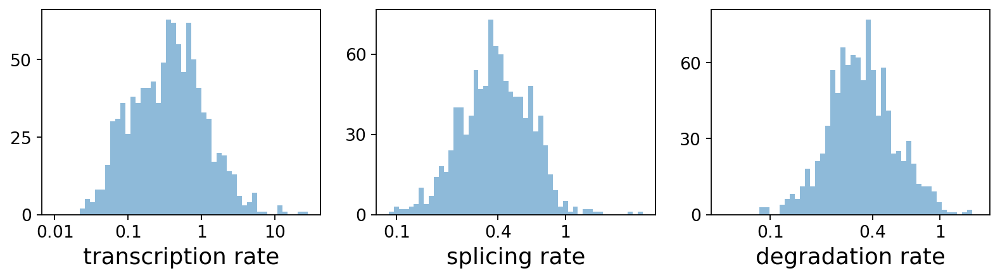

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
index,,,,,,,,,,,,,,,,
Sntg1,0.40,0.02,5.59e-03,0.09,23.40,42.85,1.03,0.03,0.41,0.0,0.0,0.16,2.47,0.09,0.15,5.36
Snhg6,0.13,0.39,2.98e+00,0.26,6.98,0.07,0.04,0.25,0.24,0.0,0.0,0.40,0.11,0.60,0.76,2.04
Sbspon,0.62,0.46,2.44e+00,0.38,3.79,0.15,0.06,0.18,0.25,0.0,0.0,0.18,0.16,0.43,0.67,1.19
Mcm3,0.29,3.10,4.00e+01,0.64,2.05,0.01,0.02,0.67,0.23,0.0,0.0,0.47,0.05,1.93,0.69,0.89
Fam135a,0.38,0.17,1.18e-01,0.20,11.24,1.12,0.36,0.15,0.28,0.0,0.0,0.39,1.35,0.39,0.67,3.39


In [31]:
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

推定される遺伝子特異的パラメータ群は以下の通りです：
- 転写率（`fit_alpha`）
- スプライシング（`fit_beta`）
- 分解（`fit_gamma`）
- スイッチングタイムポイント（`fit_t_`）
- 過少に代表される未スプライスリードを調整するためのスケーリングパラメータ（`fit_scaling`）
- 未スプライスリードとスプライスリードの標準偏差（`fit_std_u、fit_std_s`）
- 遺伝子尤度（`fit_likelihood`）
- 推論された定常状態レベル（`fit_steady_u`, `fit_steady_s`）
- それに対応する p値（`fit_pval_steady_u`, `fit_pval_steady_s`）
- モデル全体の分散（`fit_variance`）
- 遺伝子ごとの潜在時間を普遍的な遺伝子共有潜 在時間に揃えるためのスケーリング係数（`fit_alignment_scaling`）。

### 潜在時間
動的モデルは、基礎となる細胞プロセスの潜在的な時間をリカバーします。この潜伏時間は細胞の体内時計を表しており、細胞が分化する際に経験する実時間を転写動態のみに基づいて近似します。

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


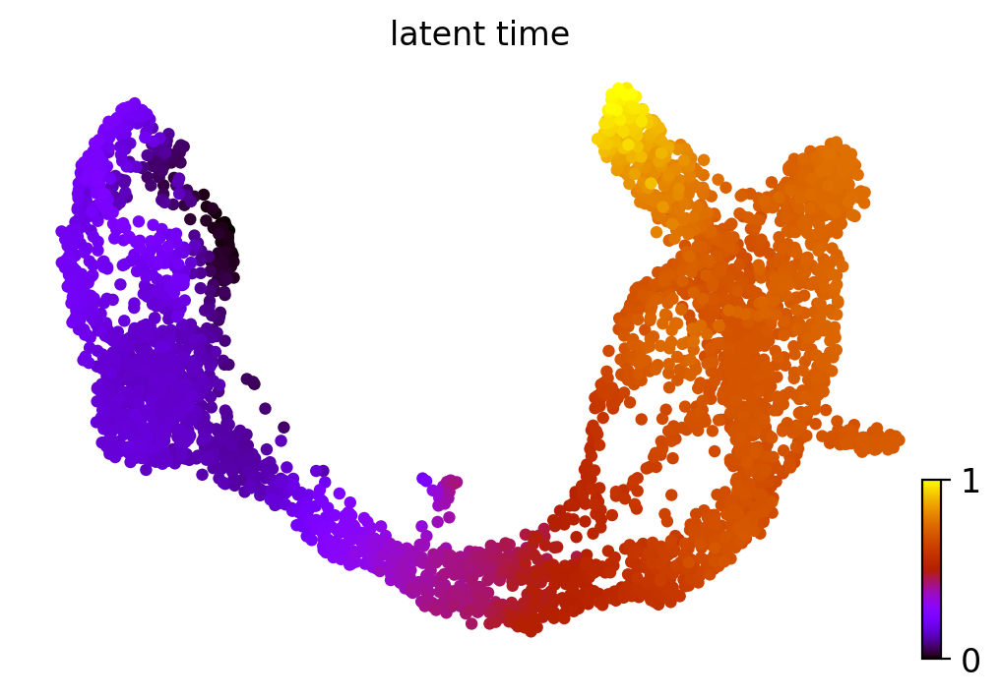

In [32]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)

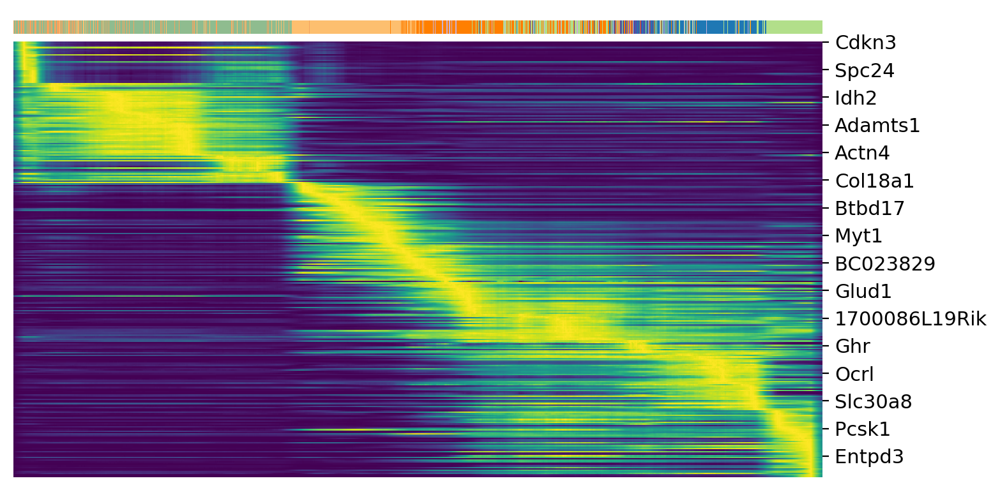

In [33]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='clusters', n_convolve=100)

### Top-likelihood genes
ドライバー遺伝子は顕著な動的挙動を示し、動的モデルでの高い尤度による特徴付けによって、系統的に検出されます。

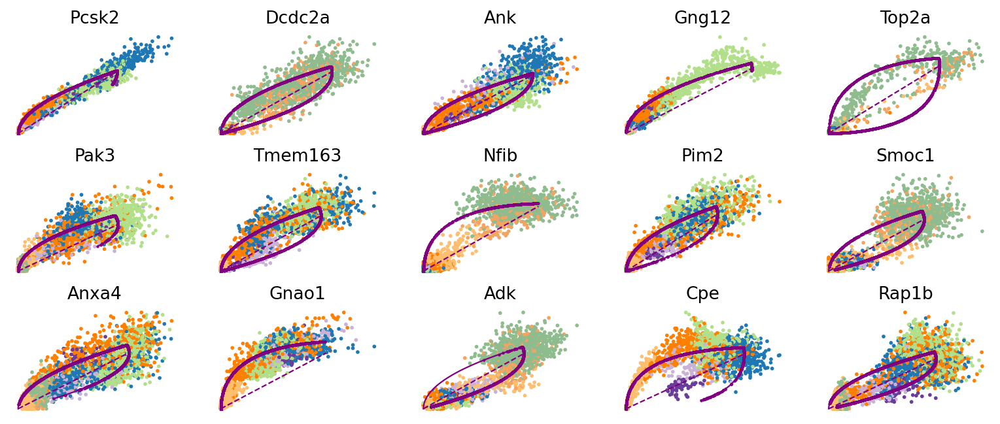

In [34]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, frameon=False)

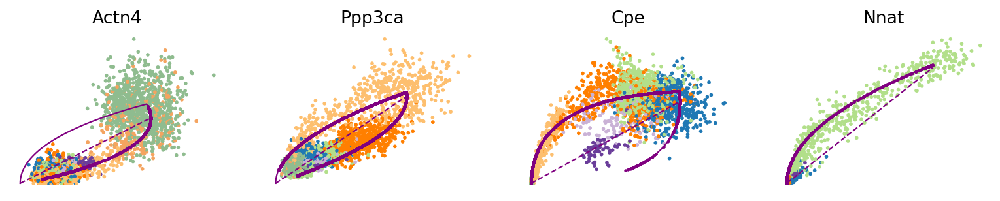

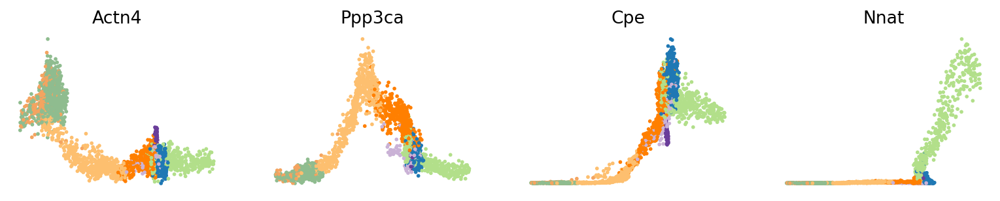

In [35]:
var_names = ['Actn4', 'Ppp3ca', 'Cpe', 'Nnat']
scv.pl.scatter(adata, var_names, frameon=False)
scv.pl.scatter(adata, x='latent_time', y=var_names, frameon=False)

### Cluster-specific top-likelihood genes
さらに、部分的な遺伝子の尤度を細胞の各クラスタに対して計算することで、潜在的なドライバーをクラスタごとに特定することができます。


In [ ]:
scv.tl.rank_dynamical_genes(adata, groupby='clusters')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:05) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
0,Dcdc2a,Dcdc2a,Rbfox3,Abcc8,Pcsk2,Cpe,Pcsk2,Tox3
1,Top2a,Adk,Mapre3,Tmem163,Ank,Gnao1,Rap1b,Rnf130
2,Nfib,Mki67,Btbd17,Gnao1,Tmem163,Pak3,Pak3,Meis2
3,Wfdc15b,Rap1gap2,Sulf2,Ank,Tspan7,Pim2,Abcc8,Adk
4,Cdk1,Top2a,Tcp11,Tspan7,Map1b,Map1b,Klhl32,Rap1gap2


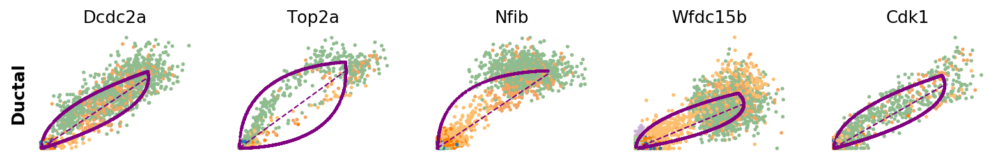

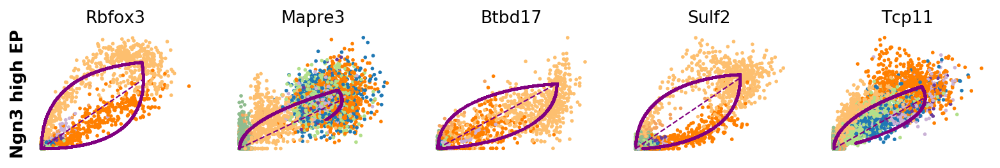

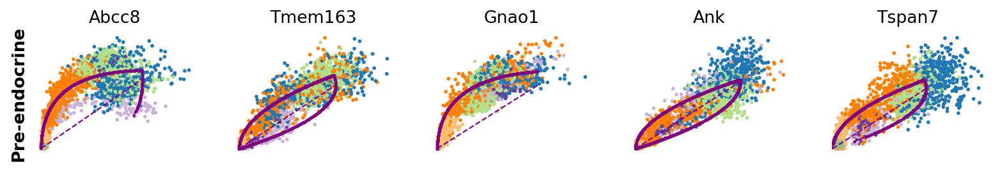

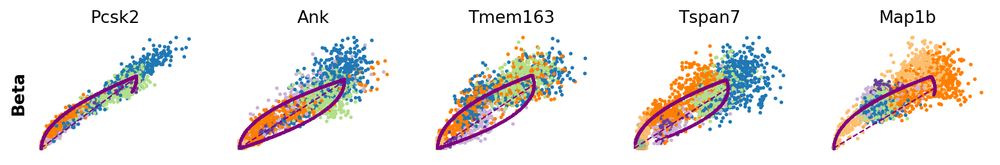

In [ ]:
for cluster in ['Ductal', 'Ngn3 high EP', 'Pre-endocrine', 'Beta']:
    scv.pl.scatter(adata, df[cluster][:5], ylabel=cluster, frameon=False)

  ## Differential Kinetics

https://scvelo.readthedocs.io/DifferentialKinetics.html
    
重要な問題の一つは、複数の系統やプロセスを代表するシステムを扱うことで、遺伝子が亜集団間で異なる運動状態を示す可能性があることです。異なる細胞の状態や系統は、一般的に遺伝子制御ネットワークの異なるバリエーションによって支配されており、それゆえに異なるスプライシングのキネティクスを示す可能性があります。これにより、位相空間で複数の軌跡を示す遺伝子が発生することになります。

これに対処するために、動的モデルを使用して、微分キネティクスの尤度比検定を実行することができます。このようにして、全体のダイナミクスの単一モデルでは十分に説明できない運動学的挙動を示すクラスタを検出することができます。細胞タイプを異なる運動領域にクラスタリングすることで、各領域を個別に適合させることができます。

説明のために、我々は、複数の不均一なサブ集団からなる歯状回神経新生に微分運動論的解析を適用します。

In [36]:
import scvelo as scv
scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo')  # for beautified visualization

Running scvelo 0.2.3 (python 3.7.10) on 2021-04-28 12:46.


In [37]:
adata = scv.datasets.dentategyrus()
scv.pp.filter_and_normalize(adata, min_shared_counts=30, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)


Filtered out 11019 genes that are detected 30 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


### Basic Velocity Estimation


computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


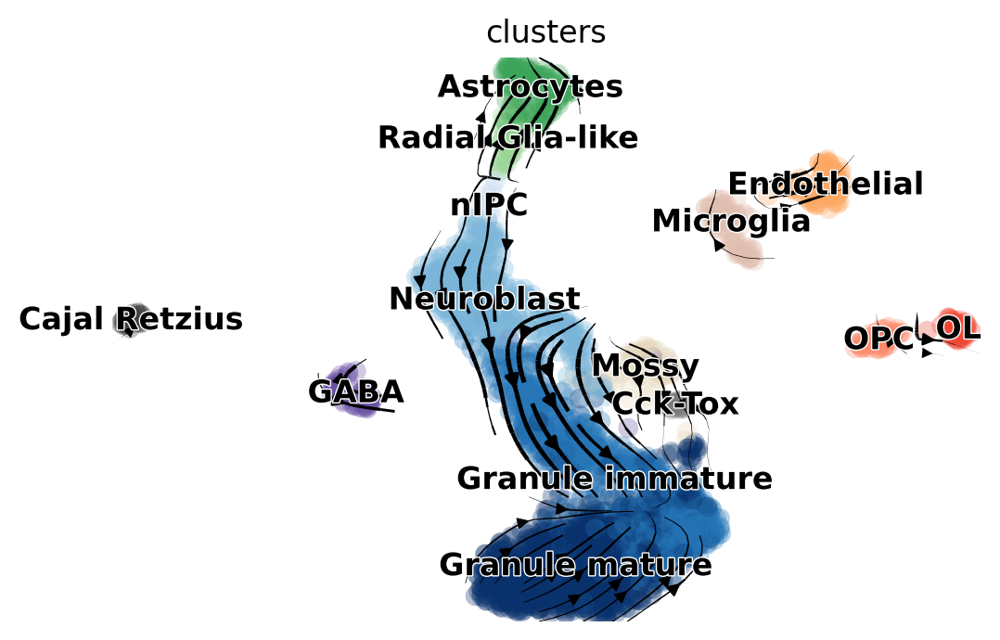

In [38]:
scv.tl.velocity(adata)
scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(adata, basis='umap')

### Differential Kinetic Test

異なる細胞タイプや系統は、異なるネットワーク構造によって支配されることがあるため、異なるキネティクスレジームを示すことがあります。細胞タイプや系統が関連していても、代替スプライシング、代替ポリアデニル化、分解の変調により、キネティクスが異なる場合があります。

動的モデルは、全体的なダイナミクスのための単一のモデルでは十分に説明できない運動学的挙動を示すクラスタ/リネージュを検出するために、微分運動学のための尤度比検定を使用して、この問題に対処することができます。各細胞タイプは、独立した適合が有意に改善された尤度をもたらすかどうかがテストされます。

漸近的カイ2乗分布に従う尤度比は、有意性をテストすることができます。効率性の理由から、クラスタが全体的な運動論によって十分に説明されているか、または異なる運動論を示すかをテストするために、デフォルトでは、完全な位相軌跡の代わりに直交回帰が使用されていることに注意してください。

In [39]:
var_names = ['Tmsb10', 'Fam155a', 'Hn1', 'Rpl6']
scv.tl.differential_kinetic_test(adata, var_names=var_names, groupby='clusters')

recovering dynamics (using 1/2 cores)
    finished (0:00:02) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)

outputs model fit of gene: Rpl6
testing for differential kinetics
    finished (0:00:00) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pval_kinetics', p-values of differential kinetics (adata.var)

outputs model fit of gene: Rpl6


In [40]:
scv.get_df(adata[:, var_names], ['fit_diff_kinetics', 'fit_pval_kinetics'], precision=2)

,fit_diff_kinetics,fit_pval_kinetics
index,,
Tmsb10,Endothelial,6.02e-16
Fam155a,Cajal Retzius,8.35e-161
Hn1,Microglia,3.02e-03
Rpl6,Microglia,6.27e-15


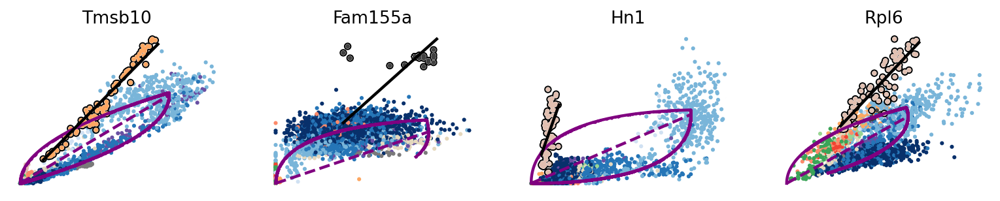

In [41]:
kwargs = dict(linewidth=2, add_linfit=True, frameon=False)
scv.pl.scatter(adata, basis=var_names, add_outline='fit_diff_kinetics', **kwargs)

例えばTmsb10では、内皮は全体的なダイナミクス（紫の曲線）ではうまく説明できないようなキネティックな挙動（輪郭を描き、黒の線を当てはめたもの）を示しています。

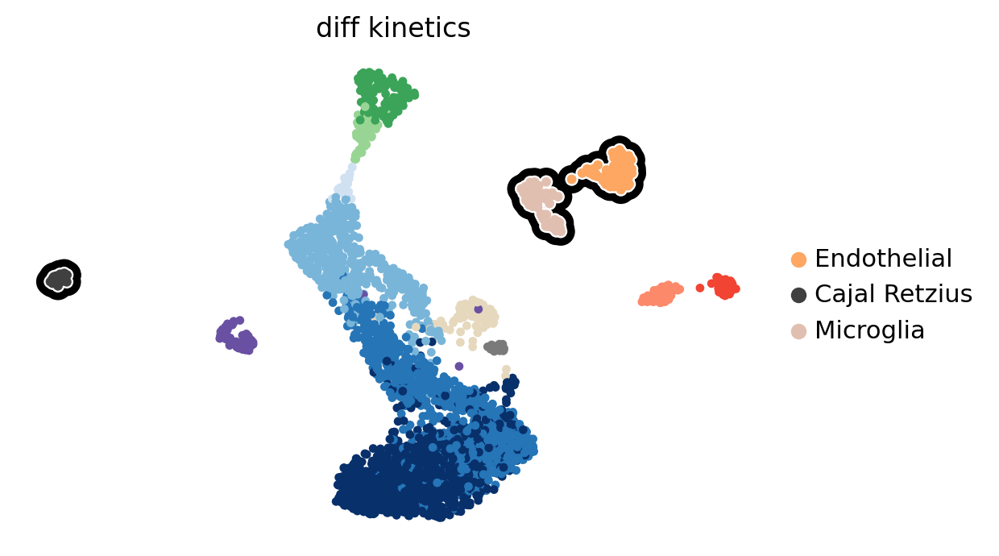

In [42]:
diff_clusters=list(adata[:, var_names].var['fit_diff_kinetics'])
scv.pl.scatter(adata, legend_loc='right', size=60, title='diff kinetics',
               add_outline=diff_clusters, outline_width=(.8, .2))

### Testing top-likelihood genes
尤度の高い遺伝子をスクリーニングすると、遺伝子ごとに複数のキネティックレジームを示すダイナミクスがいくつか見つかります。

In [43]:
scv.tl.recover_dynamics(adata)
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='clusters')


recovering dynamics (using 1/2 cores)



    finished (0:03:32) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
testing for differential kinetics
    finished (0:00:21) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pval_kinetics', p-values of differential kinetics (adata.var)


Particularly, cell types that are distinct from the main granule - such as Cck/Tox, GABA, Endothelial, and Microglia - occur frequently.


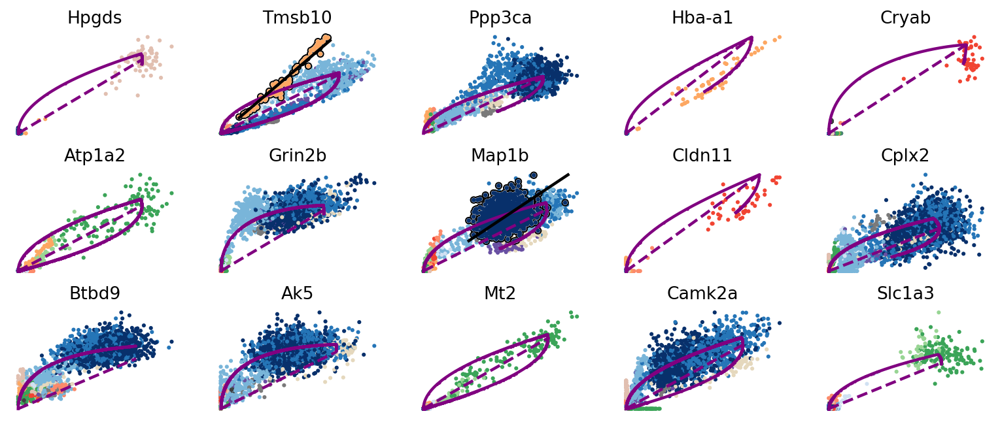

In [44]:
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, add_outline='fit_diff_kinetics', **kwargs)

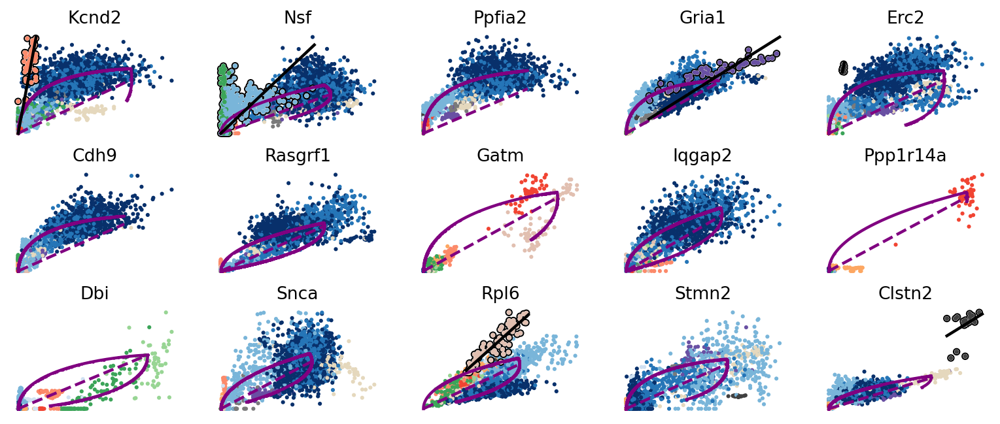

In [45]:
scv.pl.scatter(adata, basis=top_genes[15:30], ncols=5, add_outline='fit_diff_kinetics', **kwargs)

### Recompute velocities
最後に、複数の競合するキネティック・レジームの情報を利用して、速度を再計算することができます。

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


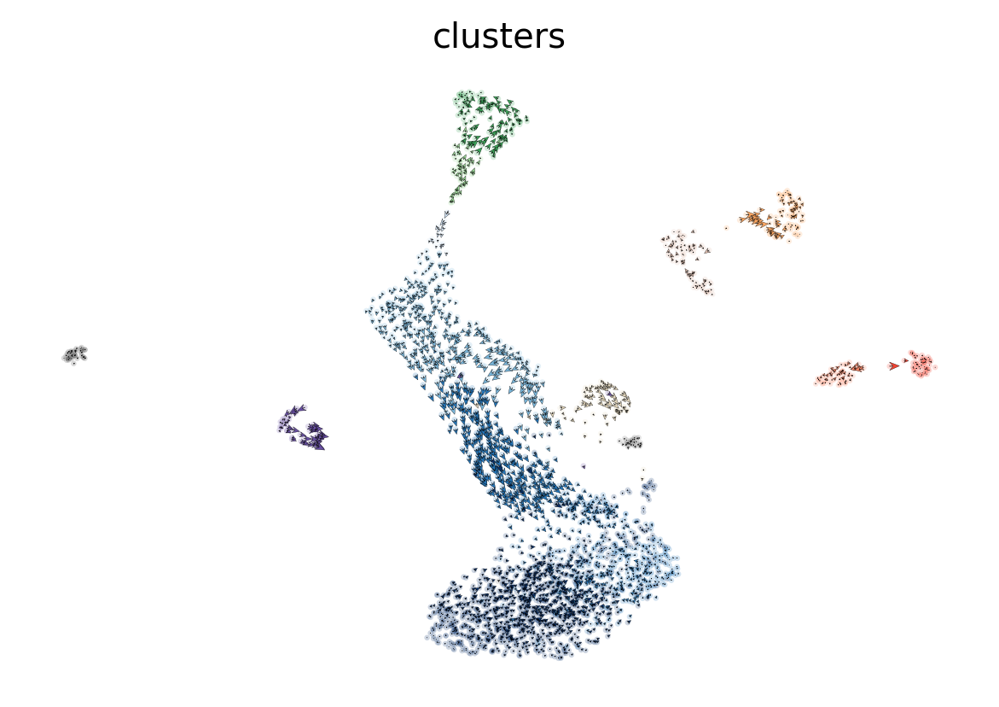

In [46]:
scv.tl.velocity(adata, diff_kinetics=True)
scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding(adata, dpi=120, arrow_size=2, arrow_length=2)

In [47]:
from sinfo import sinfo
sinfo()

-----
anndata     0.7.6
pandas      1.1.5
scvelo      0.2.3
sinfo       0.3.1
-----
IPython             5.5.0
jupyter_client      5.3.5
jupyter_core        4.7.1
notebook            5.3.1
-----
Python 3.7.10 (default, Feb 20 2021, 21:17:23) [GCC 7.5.0]
Linux-4.19.112+-x86_64-with-Ubuntu-18.04-bionic
2 logical CPU cores, x86_64
-----
Session information updated at 2021-04-28 13:04
